In [ ]:
import cv2
import glob
import os
import numpy as np
import matplotlib.pyplot as plt

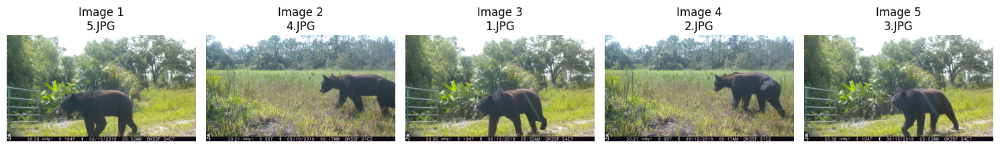

In [ ]:
image_files = glob.glob('*.JPG')[:5]

# Plot the images
plt.figure(figsize=(15, 8))

for idx, image_file in enumerate(image_files):
    # Load the image
    img = cv2.imread(image_file)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Plot the image
    plt.subplot(1, len(image_files), idx + 1)
    plt.imshow(img_rgb)
    plt.title(f"Image {idx + 1}\n{image_file}")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
# Define functions for salience computation
def compute_temporal_salience(frame, background_model):
    #Computes temporal salience by comparing the frame to the background model.
    diff = cv2.absdiff(frame, background_model)
    amplified_diff = cv2.normalize(diff, None, 0, 255, cv2.NORM_MINMAX)  # Amplify differences
    return amplified_diff

def compute_spatial_salience(frame, kernel_size=3):
    #Computes spatial salience using Gaussian blur and amplifies differences.
    blurred = cv2.GaussianBlur(frame, (kernel_size, kernel_size), 0)
    salience = cv2.absdiff(frame, blurred)
    amplified_salience = cv2.normalize(salience, None, 0, 255, cv2.NORM_MINMAX)  # Amplify differences
    return amplified_salience


Processing image 1: 5.JPG


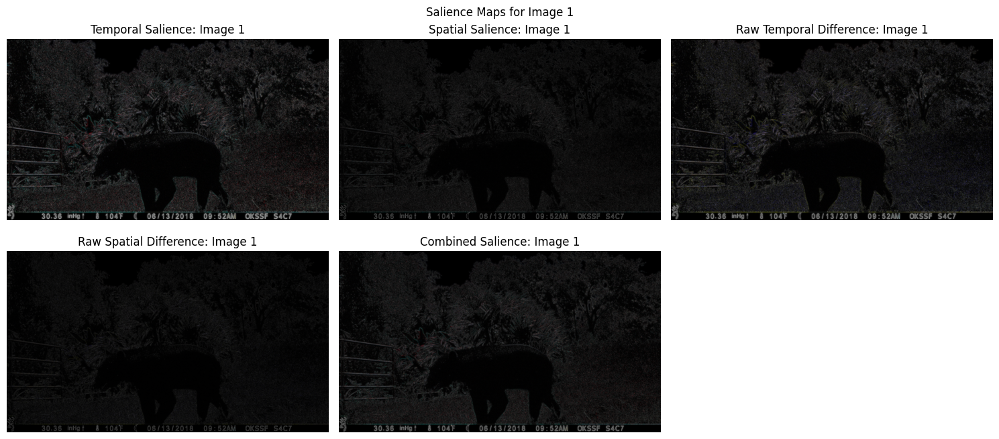

Processing image 2: 4.JPG


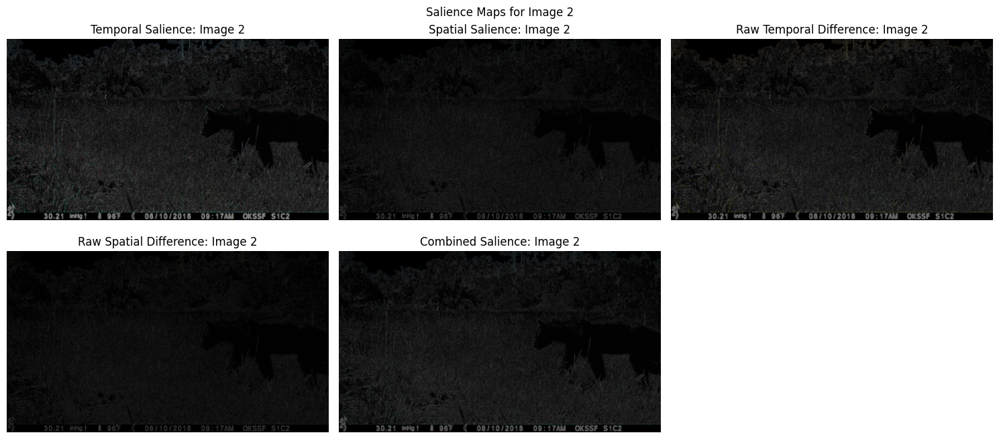

Processing image 3: 1.JPG


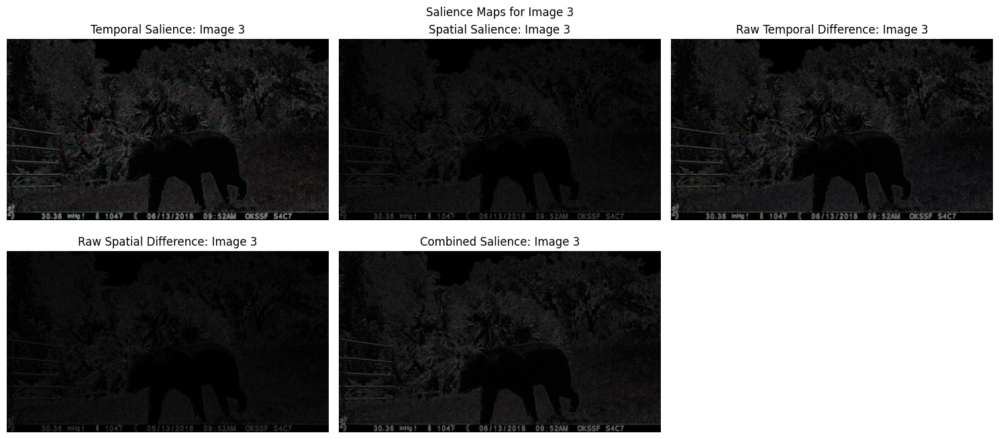

Processing image 4: 2.JPG


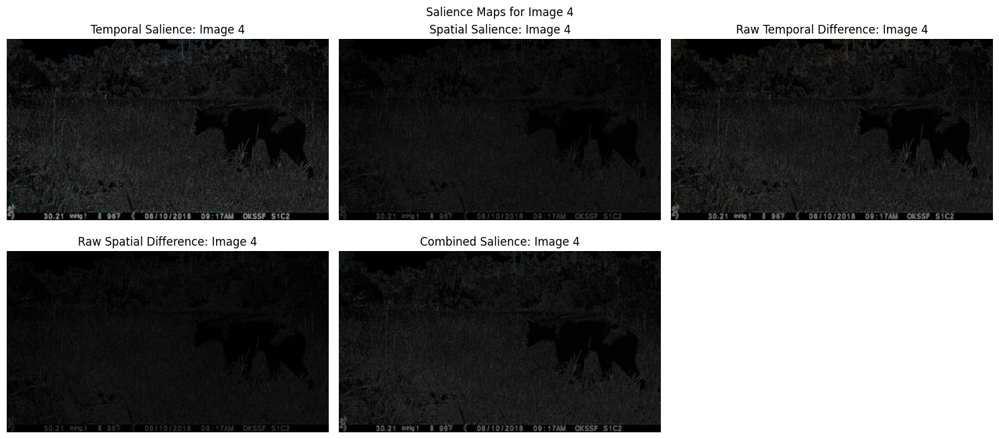

Processing image 5: 3.JPG


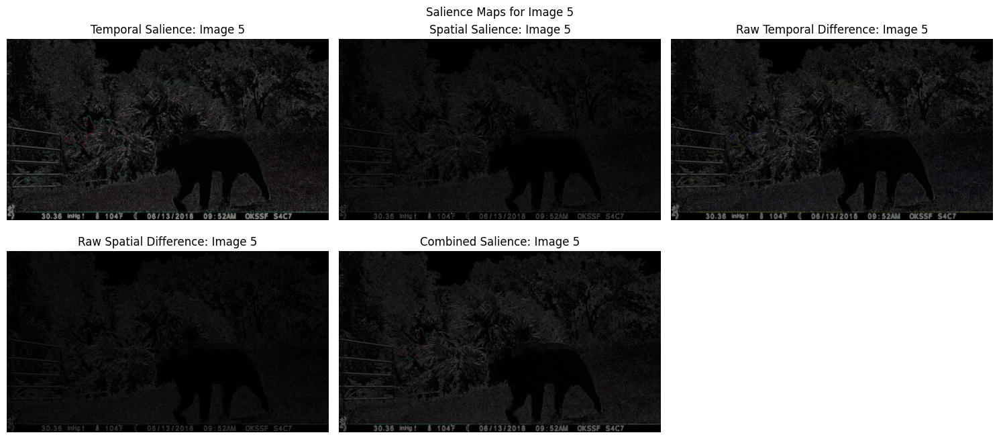

In [ ]:
# Process and plot results for each image
for idx, image_file in enumerate(image_files):
    print(f"Processing image {idx + 1}: {image_file}")

    # Load and preprocess the image
    img = cv2.imread(image_file)
    background_model = cv2.GaussianBlur(img, (21, 21), 0)

    # Compute salience
    temporal_salience = compute_temporal_salience(img, background_model)
    spatial_salience = compute_spatial_salience(img)

    # Debugging differences
    raw_temporal_diff = cv2.absdiff(img, background_model)
    raw_spatial_diff = cv2.absdiff(img, cv2.GaussianBlur(img, (5, 5), 0))

    # Plot results
    plt.figure(figsize=(15, 10))

    # Temporal Salience
    plt.subplot(3, 3, 1)
    plt.imshow(temporal_salience, cmap='gray')
    plt.title(f"Temporal Salience: Image {idx + 1}")
    plt.axis('off')

    # Spatial Salience
    plt.subplot(3, 3, 2)
    plt.imshow(spatial_salience, cmap='gray')
    plt.title(f"Spatial Salience: Image {idx + 1}")
    plt.axis('off')

    # Raw Temporal Difference
    plt.subplot(3, 3, 3)
    plt.imshow(cv2.cvtColor(raw_temporal_diff, cv2.COLOR_BGR2RGB))
    plt.title(f"Raw Temporal Difference: Image {idx + 1}")
    plt.axis('off')

    # Raw Spatial Difference
    plt.subplot(3, 3, 4)
    plt.imshow(cv2.cvtColor(raw_spatial_diff, cv2.COLOR_BGR2RGB))
    plt.title(f"Raw Spatial Difference: Image {idx + 1}")
    plt.axis('off')

    # Combined Salience
    combined_salience = cv2.addWeighted(temporal_salience, 0.5, spatial_salience, 0.5, 0)
    plt.subplot(3, 3, 5)
    plt.imshow(combined_salience, cmap='gray')
    plt.title(f"Combined Salience: Image {idx + 1}")
    plt.axis('off')

    plt.suptitle(f"Salience Maps for Image {idx + 1}")
    plt.tight_layout()
    plt.show()

In [ ]:
def compute_foreground_probability(fg_mask, beta=5):
    fg_mask = fg_mask.astype(np.uint8)
    if len(fg_mask.shape) > 2:
        fg_mask = cv2.cvtColor(fg_mask, cv2.COLOR_BGR2GRAY)

    dist_transform = cv2.distanceTransform(fg_mask, cv2.DIST_L2, 5)
    s = np.where(fg_mask > 0, 1, -1)
    prob_map = 0.5 + (1 / np.pi) * np.arctan(beta * s * dist_transform)

    return prob_map

In [ ]:
def iterative_graph_cut(img_gray, fg_mask, alpha_values=[0.1, 0.3, 0.5, 0.7, 0.9]):
    proposals = []
    fg_mask = cv2.threshold(fg_mask, 70, 255, cv2.THRESH_BINARY)[1]
    fg_mask = fg_mask.astype(np.uint8)

    for alpha in alpha_values:
        prob_map = compute_foreground_probability(fg_mask)
        mask = cv2.normalize(prob_map, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
        threshold_value = np.mean(prob_map) * 255
        _, fg_mask_refined = cv2.threshold(mask, threshold_value, 255, cv2.THRESH_BINARY)
        proposals.append(fg_mask_refined)

    return proposals



In [ ]:
def segment_foreground_background(img_gray, mask):
    mask = cv2.threshold(mask, 120, 255, cv2.THRESH_BINARY)[1]
    mask_inv = cv2.bitwise_not(mask)

    foreground = cv2.bitwise_and(img_gray, img_gray, mask=mask)
    background = cv2.bitwise_and(img_gray, img_gray, mask=mask_inv)

    return foreground, background


Processing image 1: 5.JPG


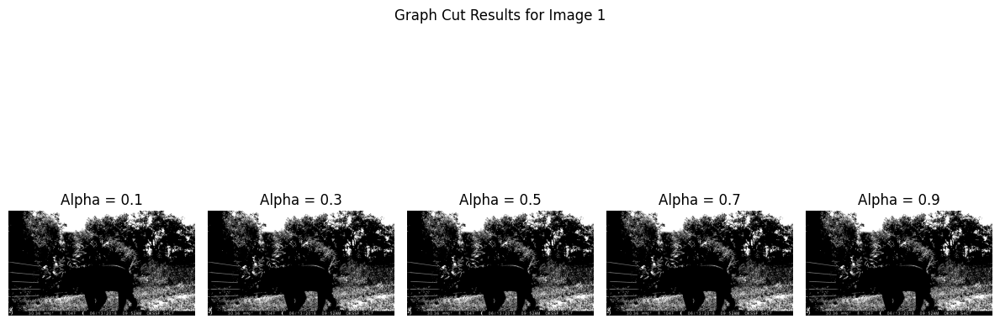

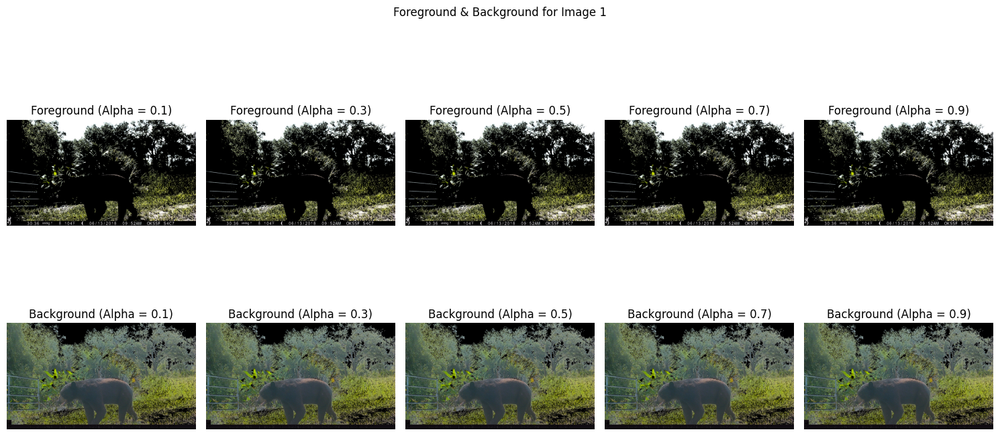

Processing image 2: 4.JPG


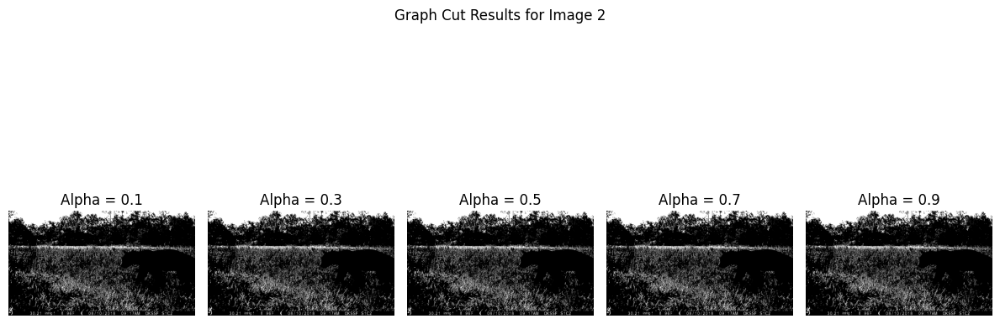

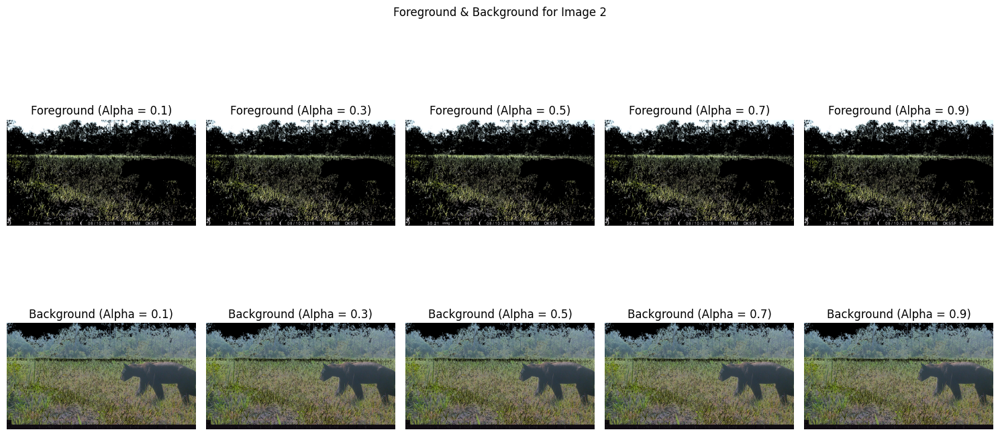

Processing image 3: 1.JPG


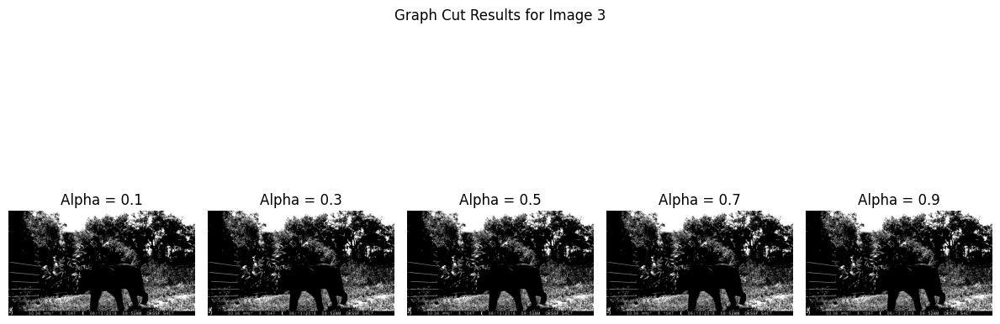

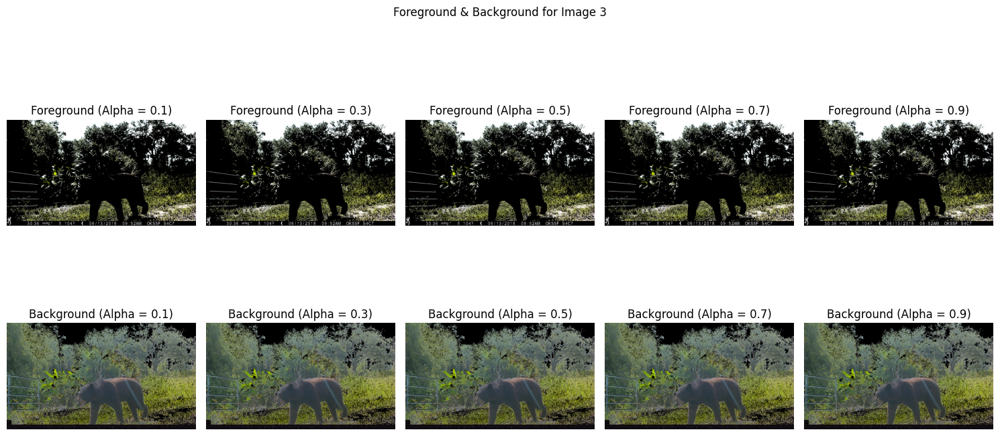

Processing image 4: 2.JPG


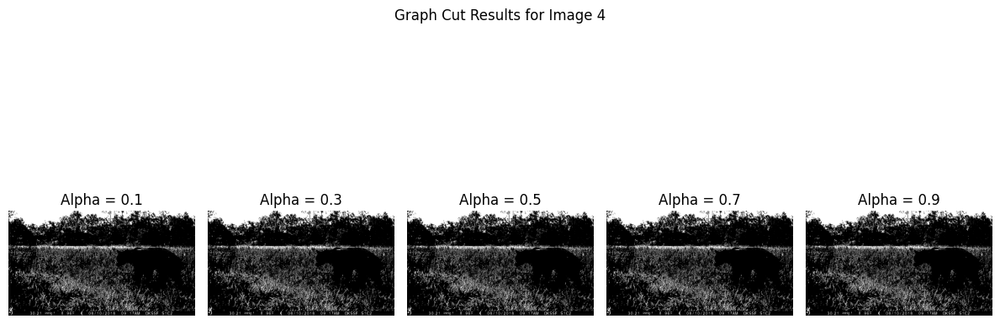

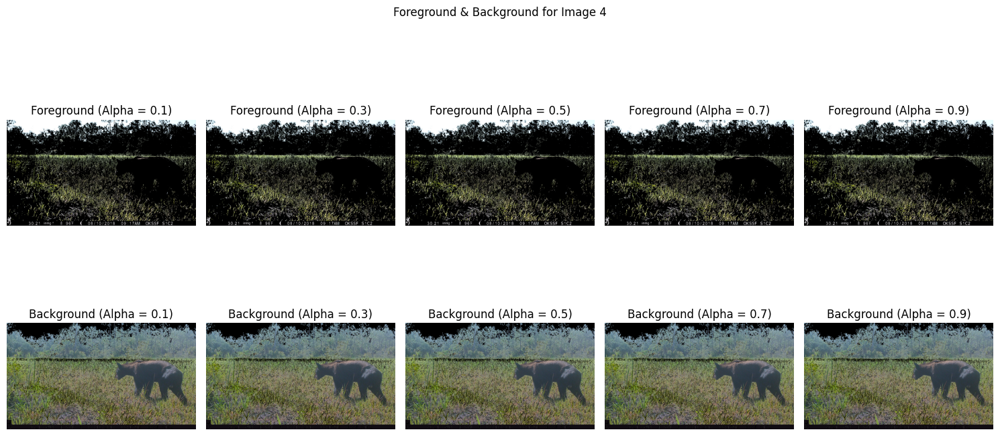

Processing image 5: 3.JPG


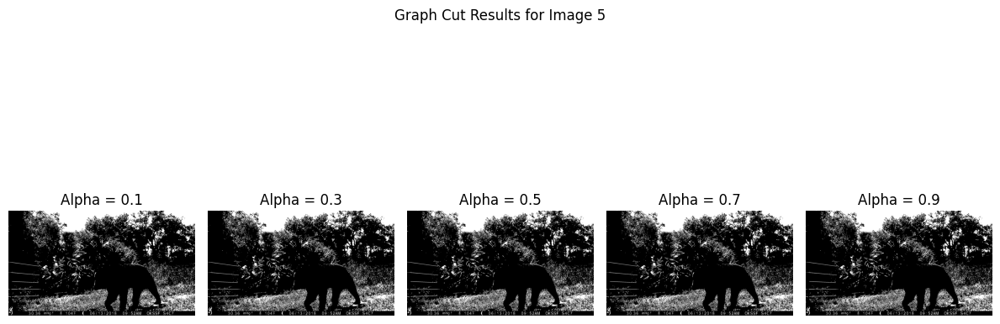

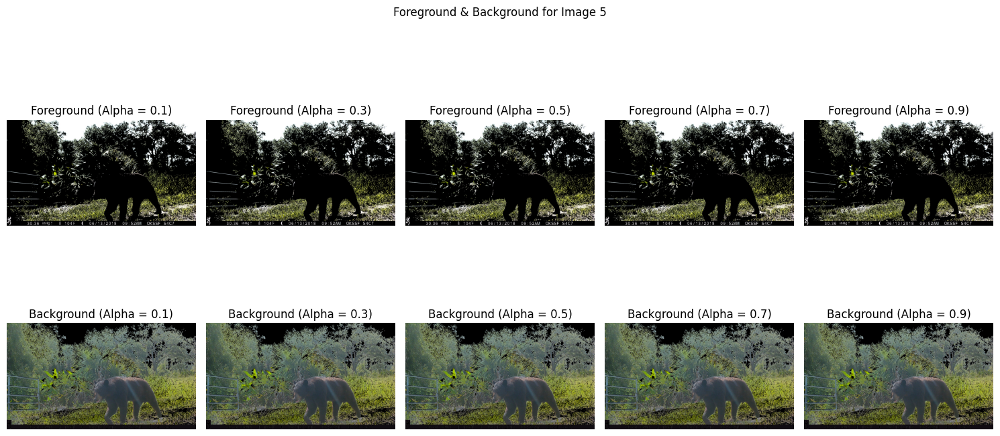

In [ ]:
# Get the first 5 image files
image_files = glob.glob('*.JPG')[:5]
alpha_values = [0.1, 0.3, 0.5, 0.7, 0.9]

# Process each image and visualize results
for idx, image_file in enumerate(image_files):
    print(f"Processing image {idx + 1}: {image_file}")

    # Load and preprocess the image
    img = cv2.imread(image_file)
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    _, fg_mask = cv2.threshold(img_gray, 180, 255, cv2.THRESH_BINARY)

    # Perform iterative graph cut refinement
    segmentation_results = iterative_graph_cut(img_gray, fg_mask, alpha_values=alpha_values)

    # Visualize graph cut segmentation results
    plt.figure(figsize=(12, 6))
    for i, result in enumerate(segmentation_results):
        plt.subplot(1, len(segmentation_results), i + 1)
        plt.imshow(result, cmap='gray')
        plt.title(f"Alpha = {alpha_values[i]}")
        plt.axis('off')

    plt.suptitle(f"Graph Cut Results for Image {idx + 1}")
    plt.tight_layout()
    plt.show()

    # Visualize foreground and background segmentation
    plt.figure(figsize=(15, 8))
    for i, result in enumerate(segmentation_results):
        foreground, background = segment_foreground_background(img, result)

        # Plot foreground
        plt.subplot(2, len(segmentation_results), i + 1)
        plt.imshow(cv2.cvtColor(foreground, cv2.COLOR_BGR2RGB))
        plt.title(f"Foreground (Alpha = {alpha_values[i]})")
        plt.axis('off')

        # Plot background
        plt.subplot(2, len(segmentation_results), len(segmentation_results) + i + 1)
        plt.imshow(cv2.cvtColor(background, cv2.COLOR_BGR2RGB))
        plt.title(f"Background (Alpha = {alpha_values[i]})")
        plt.axis('off')

    plt.suptitle(f"Foreground & Background for Image {idx + 1}")
    plt.tight_layout()
    plt.show()


In [ ]:
def compute_foreground_mask(img):

    #Computes a binary foreground mask using simple thresholding.

    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    _, fg_mask = cv2.threshold(img_gray, 180, 255, cv2.THRESH_BINARY)
    return fg_mask

def extract_candidate_bounding_boxes(fg_mask):

    #Extracts bounding boxes of connected components in the foreground mask.

    contours, _ = cv2.findContours(fg_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    bounding_boxes = [cv2.boundingRect(contour) for contour in contours]
    return bounding_boxes


Streaming output truncated to the last 5000 lines.
Frame 1, BBox (1668, 607, 1, 1), Score: -0.91, Classification: Animal
Frame 1, BBox (1623, 607, 1, 1), Score: -0.80, Classification: Animal
Frame 1, BBox (1617, 607, 2, 3), Score: -0.80, Classification: Animal
Frame 1, BBox (1460, 607, 3, 2), Score: -0.66, Classification: Animal
Frame 1, BBox (1453, 607, 4, 8), Score: -0.66, Classification: Animal
Frame 1, BBox (1421, 607, 1, 2), Score: -0.91, Classification: Animal
Frame 1, BBox (1354, 607, 1, 1), Score: -0.80, Classification: Animal
Frame 1, BBox (475, 607, 3, 2), Score: 0.00, Classification: Animal
Frame 1, BBox (441, 607, 5, 5), Score: -0.66, Classification: Animal
Frame 1, BBox (1759, 606, 11, 12), Score: -0.66, Classification: Animal
Frame 1, BBox (1735, 606, 2, 3), Score: -0.91, Classification: Animal
Frame 1, BBox (1585, 606, 1, 1), Score: -0.91, Classification: Animal
Frame 1, BBox (1451, 606, 3, 4), Score: -0.66, Classification: Animal
Frame 1, BBox (1436, 606, 1, 1), Score: 

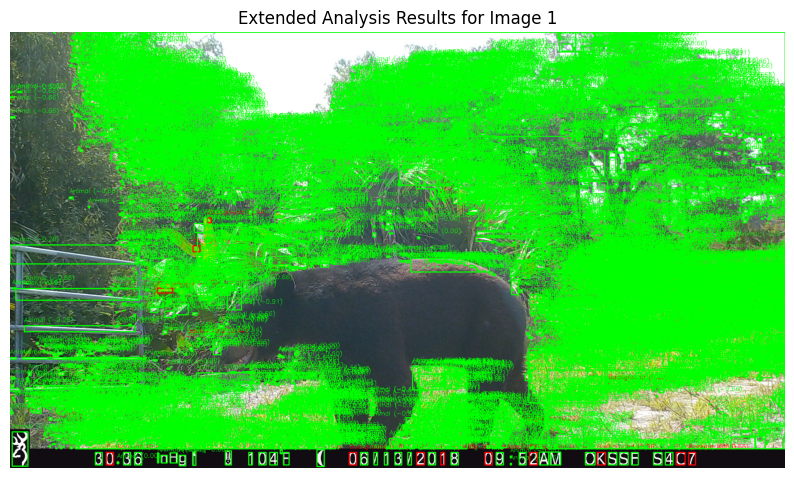

Streaming output truncated to the last 5000 lines.
Frame 2, BBox (405, 448, 2, 3), Score: -0.90, Classification: Animal
Frame 2, BBox (346, 448, 8, 7), Score: -0.77, Classification: Animal
Frame 2, BBox (198, 448, 1, 1), Score: -0.90, Classification: Animal
Frame 2, BBox (146, 448, 2, 3), Score: -0.77, Classification: Animal
Frame 2, BBox (56, 448, 3, 2), Score: -0.77, Classification: Animal
Frame 2, BBox (9, 448, 4, 2), Score: -0.77, Classification: Animal
Frame 2, BBox (1897, 447, 2, 2), Score: -0.77, Classification: Animal
Frame 2, BBox (1142, 447, 1, 1), Score: -0.90, Classification: Animal
Frame 2, BBox (1138, 447, 2, 3), Score: -0.19, Classification: Animal
Frame 2, BBox (1084, 447, 9, 13), Score: -0.77, Classification: Animal
Frame 2, BBox (1080, 447, 3, 9), Score: -0.77, Classification: Animal
Frame 2, BBox (1056, 447, 1, 2), Score: -0.77, Classification: Animal
Frame 2, BBox (994, 447, 2, 4), Score: -0.77, Classification: Animal
Frame 2, BBox (847, 447, 2, 2), Score: -0.77, Cl

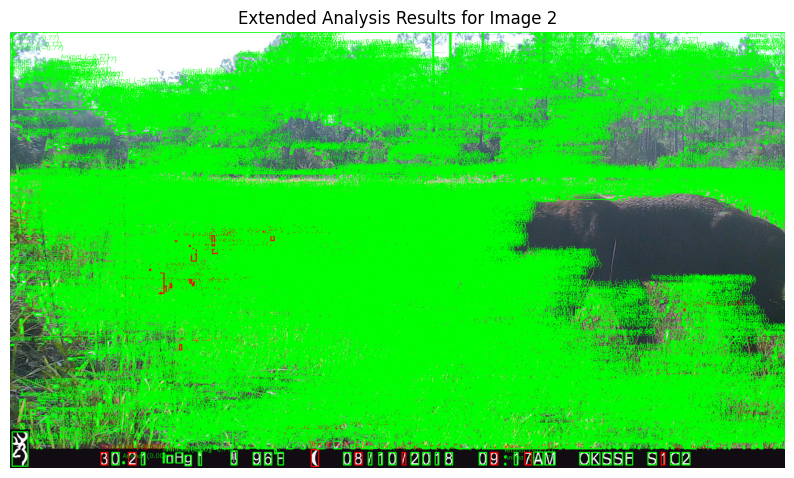

Streaming output truncated to the last 5000 lines.
Frame 3, BBox (1430, 604, 2, 3), Score: -0.31, Classification: Animal
Frame 3, BBox (1380, 604, 1, 1), Score: -0.88, Classification: Animal
Frame 3, BBox (518, 604, 1, 1), Score: -0.12, Classification: Animal
Frame 3, BBox (492, 604, 21, 14), Score: -0.88, Classification: Animal
Frame 3, BBox (464, 604, 1, 1), Score: -0.69, Classification: Animal
Frame 3, BBox (1843, 603, 4, 7), Score: -0.31, Classification: Animal
Frame 3, BBox (1779, 603, 1, 1), Score: -0.69, Classification: Animal
Frame 3, BBox (1712, 603, 3, 3), Score: -0.31, Classification: Animal
Frame 3, BBox (1673, 603, 3, 3), Score: -0.31, Classification: Animal
Frame 3, BBox (1610, 603, 3, 3), Score: -0.31, Classification: Animal
Frame 3, BBox (1582, 603, 1, 1), Score: -0.69, Classification: Animal
Frame 3, BBox (1555, 603, 4, 3), Score: -0.31, Classification: Animal
Frame 3, BBox (1514, 603, 2, 1), Score: -0.31, Classification: Animal
Frame 3, BBox (1490, 603, 5, 4), Score: 

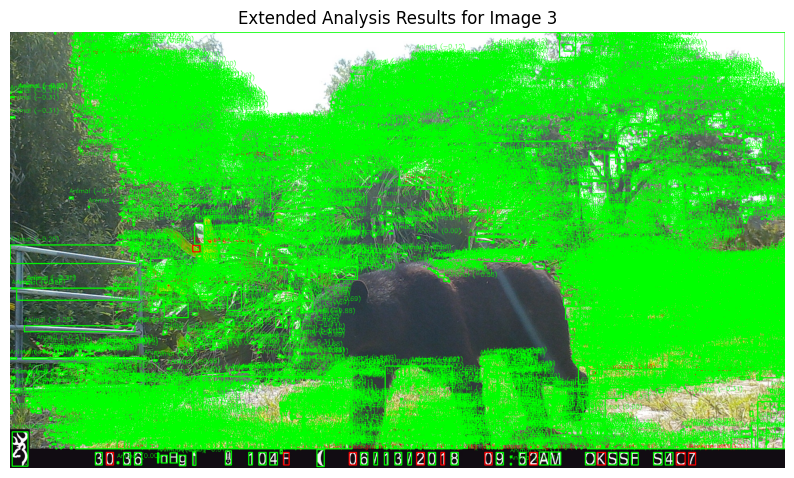

Streaming output truncated to the last 5000 lines.
Frame 4, BBox (1354, 936, 2, 1), Score: -0.42, Classification: Animal
Frame 4, BBox (1161, 936, 17, 35), Score: -0.42, Classification: Animal
Frame 4, BBox (964, 936, 5, 5), Score: -0.10, Classification: Animal
Frame 4, BBox (863, 936, 1, 1), Score: -0.81, Classification: Animal
Frame 4, BBox (749, 936, 4, 4), Score: 0.00, Classification: Animal
Frame 4, BBox (646, 936, 1, 1), Score: -0.42, Classification: Animal
Frame 4, BBox (641, 936, 3, 4), Score: -0.42, Classification: Animal
Frame 4, BBox (630, 936, 2, 5), Score: 0.00, Classification: Animal
Frame 4, BBox (1703, 935, 2, 7), Score: 0.00, Classification: Animal
Frame 4, BBox (1634, 935, 1, 1), Score: -0.10, Classification: Animal
Frame 4, BBox (1542, 935, 18, 20), Score: -0.23, Classification: Animal
Frame 4, BBox (1066, 935, 5, 3), Score: -0.10, Classification: Animal
Frame 4, BBox (636, 935, 5, 5), Score: 0.00, Classification: Animal
Frame 4, BBox (559, 935, 4, 3), Score: 0.00, C

In [ ]:
def extract_patches_from_sequence(image_sequence, bounding_box, current_index, overlap_thresh=0.25):
    #Extract co-located patches from other frames in the sequence.
    x, y, w, h = bounding_box
    patches = []
    for idx, other_frame_path in enumerate(image_sequence):
        if idx == current_index:  # Skip the current frame
            continue

        # Load the image
        other_frame = cv2.imread(other_frame_path)  # Load the image from the path

        # Ensurig the frame was loaded
        if other_frame is None:
            print(f"Warning: Could not load image {other_frame_path}. Skipping.")
            continue

        # Compute foreground mask for the other frame
        other_fg_mask = compute_foreground_mask(other_frame)

        # Calculate overlap
        overlap = np.sum(other_fg_mask[y:y+h, x:x+w] > 0) / (w * h)
        if overlap < overlap_thresh:  # Only include patches with low overlap
            patch = other_frame[y:y+h, x:x+w]
            patches.append(patch)
    return patches

def verify_patch_similarity(patch1, patch2):
    """Compare similarity between two patches using histogram correlation."""
    hist1 = cv2.calcHist([patch1], [0], None, [256], [0, 256])
    hist2 = cv2.calcHist([patch2], [0], None, [256], [0, 256])
    correlation = cv2.compareHist(hist1, hist2, cv2.HISTCMP_CORREL)
    return 1 if correlation > 0.8 else -1  # Threshold for similarity

def compute_weighted_score(bounding_box_patch, patches, temporal_weights):
    """Compute the weighted decision score for a bounding box."""
    score = 0
    for i, patch in enumerate(patches):
        similarity = verify_patch_similarity(bounding_box_patch, patch)
        score += temporal_weights[i] * similarity
    return score

# Process each image and compute classification
for idx, image_file in enumerate(image_files):
    print(f"Processing image {idx + 1} for extended analysis: {image_file}")

    # Load and preprocess the image
    img = cv2.imread(image_file)
    fg_mask = compute_foreground_mask(img)
    bounding_boxes = extract_candidate_bounding_boxes(fg_mask)

    # Extract patches and compute scores
    for bbox in bounding_boxes:
        x, y, w, h = bbox
        bbox_patch = img[y:y+h, x:x+w]

        # Extract patches from other frames
        patches = extract_patches_from_sequence(image_sequence=image_files,
                                                bounding_box=bbox,
                                                current_index=idx)

        # Assign temporal weights
        temporal_weights = [1 / (abs(idx - i) + 1) for i in range(len(image_files))]
        temporal_weights = np.array(temporal_weights) / np.sum(temporal_weights)  # Normalize weights

        # Compute decision score
        score = compute_weighted_score(bbox_patch, patches, temporal_weights)

        # Classify based on score
        classification = "Animal" if score <= 0 else "Background"
        print(f"Frame {idx + 1}, BBox {bbox}, Score: {score:.2f}, Classification: {classification}")

        # Visualize classification results
        color = (0, 255, 0) if classification == "Animal" else (0, 0, 255)
        cv2.rectangle(img, (x, y), (x + w, y + h), color, 2)
        label = f"{classification} ({score:.2f})"
        cv2.putText(img, label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)

    # Display the results
    plt.figure(figsize=(10, 6))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(f"Extended Analysis Results for Image {idx + 1}")
    plt.axis('off')
    plt.show()
